# Загружаем данные

In [100]:
# загружаем бибилиотеки
from pandas import Series
import pandas as pd
import numpy as np
import pandas_profiling
from datetime import datetime
from itertools import combinations
from scipy.stats import ttest_ind
import statsmodels.api as sm
import scipy.stats as sst

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    roc_curve,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score,
    log_loss,
    auc,
)
from sklearn.pipeline import Pipeline as pipe

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

import warnings

warnings.filterwarnings("ignore")

from feature_engine.outliers import OutlierTrimmer
from feature_engine.creation import MathematicalCombination
from feature_engine.imputation import MeanMedianImputer

from catboost import CatBoostClassifier, Pool, cv

pd.set_option("display.max_columns", None)

from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler


In [7]:
# зафиксируем константы для воспроизводимости экспериментов
RANDOM_SEED = 42
!pip freeze > requirements.txt
CURRENT_DATE = datetime.now()

In [63]:
class ModelInspect:  # класс для оценки метрик модели
    def __init__(self, model, X_test, y_test):
        self.X_test = X_test
        self.y_test = y_test
        self.y_pred = model.predict(X_test)
        self.probs = model.predict_proba(X_test)[:, 1]

    def roc_curve_plot(self):
        fpr, tpr, threshold = roc_curve(self.y_test, self.probs)
        roc_auc = roc_auc_score(self.y_test, self.probs)

        plt.figure()
        plt.plot([0, 1], label="Baseline", linestyle="--")
        plt.plot(fpr, tpr, label="Regression")
        plt.title("Logistic Regression ROC AUC = %0.10f" % roc_auc)
        plt.ylabel("True Positive Rate")
        plt.xlabel("False Positive Rate")
        plt.legend(loc="lower right")
        plt.show()

    def confusion_matrix_plot(self):
        tn, fp, fn, tp = confusion_matrix(self.y_test, self.y_pred).ravel()
        cf_matrix = np.array([[tp, fp], [fn, tn]])
        group_names = ["TP", "FP", "FN", "TN"]
        group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
        labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_names, group_counts)]
        labels = np.asarray(labels).reshape(2, 2)
        plt.figure()
        sns.heatmap(
            cf_matrix,
            annot=labels,
            annot_kws={"size": 20},
            fmt="",
            cmap="Pastel1",
            cbar=False,
            xticklabels=["Дефолт", "Не дефолт"],
            yticklabels=["Дефолт", "Не дефолт"],
        )
        plt.title("Матрица ошибок для default")
        plt.show()

    def get_metrics(self):
        result = pd.Series(
            {
                "accuracy": accuracy_score(self.y_test, self.y_pred),
                "logloss": log_loss(self.y_test, self.y_pred),
                "precision": precision_score(self.y_test, self.y_pred),
                "recall": recall_score(self.y_test, self.y_pred),
                "F1": f1_score(self.y_test, self.y_pred),
                "ROC_AUC": roc_auc_score(self.y_test, self.probs),
            }
        )
        return result


In [57]:
# импортируем данные
data_directory = "/work/skillfactory_rds/sf_module_4/data_kaggle/"
train = pd.read_csv(data_directory + "train.csv")
test = pd.read_csv(data_directory + "test.csv")
sample_submission = pd.read_csv(data_directory + "/sample_submission.csv")


In [10]:
# для корректной обработки признаков объединяем трейн и тест в один датасет
train["Train"] = 1  # помечаем где у нас трейн
test["Train"] = 0  # помечаем где у нас тест

data = train.append(test, sort=False).reset_index(drop=True)  # объединяем


# Цели и задачи проекта

О чем проект?

На основании предоставленных данных найти вероятность, 
с которой клиент отдаст кредит банку. Это задача бинарной классификации, поэтому будем
брать за основу логистическую регрессию.

Что хочется попробовать?
+ добавить новые признаки и посмотреть, как они влияют на модель - добавила самые элементарные.
+ попробовать два вида регуляризации - добавила, с l1 получился лучше результат.
+ построить другие модели (catBoost, xgBoost) - получилось по пощупать catBoost. Понравилось, что отрисовывает много графиков, может внутри себя преобработать переменные в числовой формат, интересно тестировать модель - появилось ощущение, что оптимальные параметры перетекают и собираются в оптимальную модель очень логично. Не понравилось, что по сравнению с логистической регрессией, очень долго происходит обучение модели. Но это только то, что я вынесла с туториала про титаник, так что могу быть очень далека от реальности. 
+ пощупать гиперпараметры - не успела
+ разобраться с оценкой значимости - применила, но недо конца поняла
+ найти и применить как можно больше интересных метрик - можно еще добавить
+ по максимуму все обернуть в функции и классы - что смогла, сделала.
+ найти решение для того, чтобы EDA не занимало большую часть времени и проекта - сделала.
+ убрать выбросы и проверить качество - 
+ убрать не значимые признаки и проверить качество - 
+ избавиться от дисбаланса классов и посмотреть на улучшение - нет.
+ добавить в model_selection - kFold, StratifiedKFold - добавила, улучшило скор.
+ попробовать работать в команде - откликнулась только Екатерина Козлова, но у нее
дедлайн на неделю раньше и у меня не получилось быстро въехать в проект, чтобы вместе 
сдать. Для себя вынесла, что надо заранее обговаривать,
в какой среде делаем проект, что для каждого значит работа в команде, какие задачи, 
кто берет на себя. 
+ протестировать AWS Glue DataBrew от Amazon для предварительной обработки данных - 
потыкала немного, выглядит как ексель для дата саентиста, нужно гораздо больше опыта, чтобы пользоваться

Какие появлялись вопросы в ходе работы?
+ зависаю, когда пытаюсь осознать, что происходит, когда мы пытаемся подобрать наилучший 
параметр. Те с какого момента надо подгружать все функции, по которым мы обрабатываем
файл. И как вообще строить весь поток работы - что применять, в каком порядке, в
каком виде это уйдет в работу. Я понимаю, что нужна практика, но иногда прям торможу 
и не понимаю за что хвататься. Как решаю - читаю про введение в мл от A.Myuller и S.Gvido.
+ плохо программирую. Как решаю - начала проходить задания на питонтьютор.
+ плохо визуализирую и оцениваю эти визуализации. Как решаю - очень
понравился бесплатный курс от tableau (например, вот про боксплоты
https://tableau.pro/m20) - читаю, делаю задания.

Что было сделано?

1. Все данные были загружены, объединены в один датасет
2. Посмотрела на test и train отдельно с помощью pandas_profiling, поискала 
ошибки, пропуски 
3. Обработала данные 
4. Подготовила данные для машинного обучения
5. Сделала наивную модель с помощью логиситической регрессии
6. Увеличивала предсказательную способность модели


Что еще можно сделать?

1. Сгенерировать больше признаков
2. Попробовать третий вид регуляризации
3. Поиграть с уровнем регуляризации в логистической регресии (С)
4. Проверить, что оценка значимости происходит правильно и незначимые колонки выпадают
5. Применить xgBoost
6. Попробовать разные алгоритмы для того, чтобы избавиться от дисбаланса в выборке - разобраться с f1_micro и f1_macro.
7. Сейчас признак score_bki отрицательный - попробовать взять его в квадарте?
8. SVM вообще никак не применила
9. Применить Outlier Handling из Feature-engine для обработки выбросов
10. Не забывать про комментарии к коду

Очень интересно было делать проект, но было постоянно ощущение, что иду "по приборам". Хочется верить, что с практикой обрету понимание. Потратила на выполнение чуть больше 30 часов.
Я постаралась сделать эту часть максиально подробно, чтобы самой было проще вспомнить и доделать.

Самый высокий результат показал CatBoost = 0.74177, 10 позиция на лидерборде, не зря ходила на ваши вебинары. =) 

# Предварительный анализ данных 

In [66]:
# смотрим описательные статистики
data.describe()


In [103]:
# визуально проверяем данные
data.sample(3)


,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train
29900,75968,24MAR2014,SCH,M,59,N,N,0,0,-2.131873,1,50,1,2,55000,1,4,Y,0.0,1
69302,21608,29JAN2014,SCH,F,27,N,N,0,0,-0.905319,1,50,1,2,20000,1,3,N,1.0,1
31313,32137,08FEB2014,SCH,M,62,N,N,0,0,-1.792320,0,50,1,1,14000,1,2,N,1.0,1


In [104]:
# первые две строчки
data.head(2)


,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train
0,25905,01FEB2014,SCH,M,62,Y,Y,0,0,-2.008753,1,50,1,2,18000,4,1,N,0.0,1
1,63161,12MAR2014,SCH,F,59,N,N,0,0,-1.532276,3,50,2,3,19000,4,1,N,0.0,1


In [105]:
# последние две строчки
data.tail(2)


,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train
110146,1971,07JAN2014,UGR,F,27,N,N,1,0,-1.242392,2,80,2,3,30000,1,1,N,NaN,0
110147,69044,17MAR2014,SCH,M,38,N,N,0,0,-1.507549,2,50,1,2,15000,4,2,N,NaN,0


In [106]:
# посмотрим есть ли пропуски, колонки и тип данных
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   client_id         110148 non-null  int64  
 1   app_date          110148 non-null  object 
 2   education         109670 non-null  object 
 3   sex               110148 non-null  object 
 4   age               110148 non-null  int64  
 5   car               110148 non-null  object 
 6   car_type          110148 non-null  object 
 7   decline_app_cnt   110148 non-null  int64  
 8   good_work         110148 non-null  int64  
 9   score_bki         110148 non-null  float64
 10  bki_request_cnt   110148 non-null  int64  
 11  region_rating     110148 non-null  int64  
 12  home_address      110148 non-null  int64  
 13  work_address      110148 non-null  int64  
 14  income            110148 non-null  int64  
 15  sna               110148 non-null  int64  
 16  first_time        11

Описания полей датасета

- client_id - идентификатор клиента
- education - уровень образования - нужно заполнить пропуски
- sex - пол заемщика
- age - возраст заемщика
- car - флаг наличия автомобиля
- car_type - флаг автомобиля иномарки
- decline_app_cnt - количество отказанных прошлых заявок
- good_work - флаг наличия “хорошей” работы
- bki_request_cnt - количество запросов в БКИ
- home_address - категоризатор домашнего адреса
- work_address - категоризатор рабочего адреса
- income - доход заемщика
- foreign_passport - наличие загранпаспорта
- sna - связь заемщика с клиентами банка
- first_time - давность наличия информации о заемщике
- score_bki - скоринговый балл по данным из БКИ
- region_rating - рейтинг региона
- app_date - дата подачи заявки - необходимо преобразовать
- default - флаг дефолта по кредиту

## EDA

Посмотрим отдельно на файл test и train - может заметим дисбаланс в разделении 

In [ ]:
# сгенерируем отчет с показателями EDA для тестовой и обучающей выборки
pandas_profiling.ProfileReport(test)


Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
pandas_profiling.ProfileReport(train)


Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Выводы и предположения
Датасет в хорошем состоянии. Пропуски есть только в столбце Education, а также в default
у тестовой выборки.

Визуально просмотрев отчет для test и train, можно сказать, что датасеты разделены
корректно и нет перекосов по классам, распределение переменных одинаковое. 
Поэтому посмотрим подробнее на переменные в train и попробуем предположить какие
могут быть зависимости с целевой переменной.

- Есть ли в client_id какая-либо информация кроме номера клиента? По графику можно
заметить, что нумерация сквозная в зависимости от дня обращения.
- Есть ли связь между днем недели и дефолтом? Можно поробовать перевести даты в
дни недели и помсотреть есть ли связь.
- Можем предположить, что чем ниже уровень образования, тем выше риск дефолта.
- Большинство кредитов приходится на заемщиков в возрасте от 27 до 35 лет. Интересно
посмотреть на дефолт у заемщиков в возрасте от 21 до 26 лет и от 35 до 72 лет.
- Только у трети заемщиков есть машина, у каждого второго - иномарка. Отдают ли клиенты
с иномарками кредит чаще? И насколько нужен столбец car_type?
- В переменной decline_app_cnt можем заметить большой разброс. У большинства клиентов
(около 80%) не было заявок, в которых банк отказал, или их было одна или две.
Но есть и такие кому банк отказал больше 16 раз. Можно посмотреть насколько сильно данная
переменная влияет и стоит ли убирать значения, например, больше двух или которые выходят
за 1,5IQR.
- У 80% заемщиков нет флага о том, что у них хорошая работа. Насколько нужен будет
этот столбец в дальнейшем?
- Количество запросов в bki можно будет прологорифмировать и посмотреть на изменения.
- Для столбцов region_rating, home_address, work_address, sna, first_time будет 
интересно построить боксплоты или сводные таблицы, чтобы посмотреть на их связь с
целевой переменной.

По корреляции Пирсона видим высокую корреляцию между home_address и work_address, и 
отрицательную корреляцию sna и first_time.
По Спирману можно также увидеть связь между столбцами income и region_rating.

Просматривая отчет не были замечены ошибки заполнения и выбросы, связанные
с такими ошибками. Но можно заметить, что у некоторых признаков распределение смещенно 
(bki_request_cnt, income, region_rating, decline_app_cnt) или 
присутствуют значения, которые визуально можно трактовать, как 
выбросы (sna - параметр 3 - может его объединить со 2 или удалить?, home_address - 
значение 3).

Что с этим можно попробовать сделать?
- оставить как есть
- прологорифмировать и посмотреть как изменилось количество выбросов
- удалить то, что кажется выбросами и посмотреть на метрики
- проверить как логистическая регрессия работает с выбросами и смещенным распределением,
поискать другие модели.

Также можно попробовать сделать понижающий отбор - попробовать, например, сравнять 
количество клиентов с дефолтом и без. Или обратить внимание на алгоритмы для
несбалансированных данных.

# Подготовка данных

### Обработка education

<AxesSubplot:>

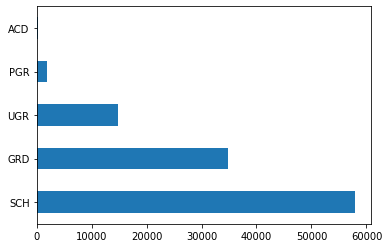

In [111]:
# смотрим на распределение
data["education"].value_counts().plot.barh()


In [112]:
mode = data.education.mode()[0]
print("Самое частое значение в поле Education: ", mode)


Самое частое значение в поле Education:  SCH


In [113]:
# Заполним пропуски в education модой
data["education"].fillna(mode, inplace=True)
data.education.unique()


array(['SCH', 'GRD', 'UGR', 'PGR', 'ACD'], dtype=object)

### Обработка app_date

In [114]:
# преобразуем в datetime
data["app_date"] = pd.to_datetime(data.app_date, format="%d%b%Y")
data["app_date"].sample(5)


43643    2014-03-09
64830    2014-04-11
67160    2014-03-20
107381   2014-04-24
68188    2014-03-01
Name: app_date, dtype: datetime64[ns]

In [115]:
# Выясняем начало и конец периода нашего датасета - это 1 января и 30 апреля 2014 года
start = data.app_date.min()
end = data.app_date.max()
start, end


(Timestamp('2014-01-01 00:00:00'), Timestamp('2014-04-30 00:00:00'))

In [116]:
# Вводим новый признак - номер дня с 1 января 2014 года
data["days"] = (data.app_date - start).dt.days.astype("int")

# Месяц подачи заявки
data["app_date_month"] = data.app_date.dt.month

# День недели, в который была подана заявка
data["app_date_weekday"] = data.app_date.dt.weekday


<AxesSubplot:>

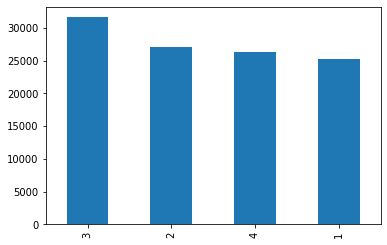

In [117]:
# проверяем распределение заявок по месяцам
data["app_date"].dt.month.value_counts().plot.bar()

# все заявки распределены примерно равномерно


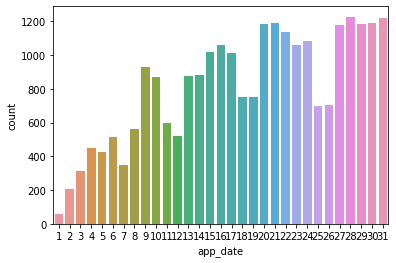

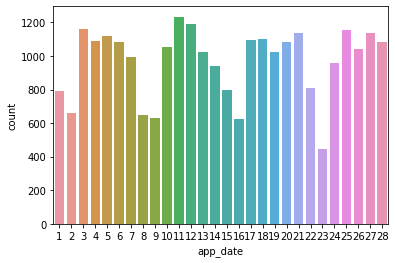

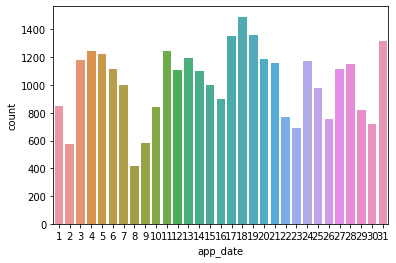

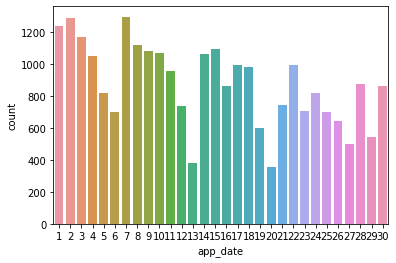

In [118]:
data["month"] = data["app_date"].dt.month
for i in [1, 2, 3, 4]:
    plt.figure()
    sns.countplot(
        x=data[data.month == i]["app_date"].dt.day, data=data[data.month == i]
    )
    plt.show()


Визуально создается впечатление, что количество заявок распределяется по линии похожей
на синусоиду. Построим новый признак - количество заявок в дне. 

In [119]:
# и еще один признак: количество заявок в данном дне
dates = data.app_date.value_counts()
data["app_cnt"] = data.app_date.apply(lambda x: dates[x])
data["app_cnt"].sample(5)


66936    1242
1062      698
20300    1226
97713    1024
76239     600
Name: app_cnt, dtype: int64

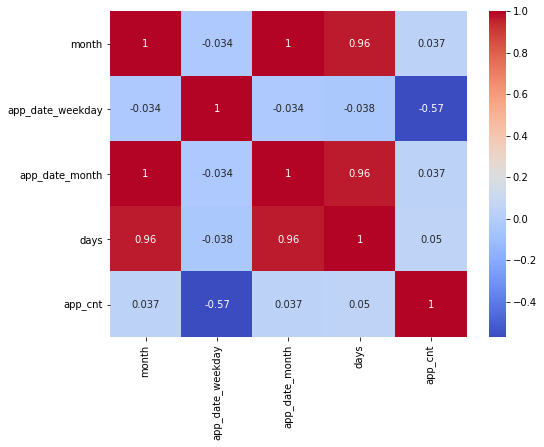

In [120]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax = sns.heatmap(
    data.loc[
        :, ["month", "app_date_weekday", "app_date_month", "days", "app_cnt"]
    ].corr(),
    annot=True,
    cmap="coolwarm",
)


Видим высокую корреляцию у month, app_date_month и days.
Оставляем app_date_weekday, days, app_cnt.

In [121]:
# Удалим из датасета признаки с высококй корреляцией
data.drop(["app_date_month", "month"], axis=1, inplace=True)
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   client_id         110148 non-null  int64         
 1   app_date          110148 non-null  datetime64[ns]
 2   education         110148 non-null  object        
 3   sex               110148 non-null  object        
 4   age               110148 non-null  int64         
 5   car               110148 non-null  object        
 6   car_type          110148 non-null  object        
 7   decline_app_cnt   110148 non-null  int64         
 8   good_work         110148 non-null  int64         
 9   score_bki         110148 non-null  float64       
 10  bki_request_cnt   110148 non-null  int64         
 11  region_rating     110148 non-null  int64         
 12  home_address      110148 non-null  int64         
 13  work_address      110148 non-null  int64         
 14  inco

### client_id

In [122]:
# Посмотрим на признак client_id
data.client_id.astype("object").describe(include="object")


count     110148
unique    110148
top            1
freq           1
Name: client_id, dtype: int64

In [123]:
data.drop(["client_id"], axis=1, inplace=True)
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   app_date          110148 non-null  datetime64[ns]
 1   education         110148 non-null  object        
 2   sex               110148 non-null  object        
 3   age               110148 non-null  int64         
 4   car               110148 non-null  object        
 5   car_type          110148 non-null  object        
 6   decline_app_cnt   110148 non-null  int64         
 7   good_work         110148 non-null  int64         
 8   score_bki         110148 non-null  float64       
 9   bki_request_cnt   110148 non-null  int64         
 10  region_rating     110148 non-null  int64         
 11  home_address      110148 non-null  int64         
 12  work_address      110148 non-null  int64         
 13  income            110148 non-null  int64         
 14  sna 

### Делим на группы

In [124]:
data.nunique().sort_values(ascending=False)


score_bki           102618
income                1207
app_date               120
days                   120
app_cnt                113
age                     52
bki_request_cnt         40
decline_app_cnt         24
app_date_weekday         7
region_rating            7
education                5
first_time               4
sna                      4
home_address             3
work_address             3
car                      2
foreign_passport         2
default                  2
Train                    2
sex                      2
good_work                2
car_type                 2
dtype: int64

In [125]:
# числовые признаки
num_cols = [
    "score_bki",
    "income",
    "age",
    "days",
    "bki_request_cnt",
    "decline_app_cnt",
    "app_cnt",
]
# бинарные признаки
bin_cols = ["sex", "good_work", "car", "car_type", "foreign_passport"]
# категориальные признаки
cat_cols = [
    "education",
    "sna",
    "first_time",
    "app_date_weekday",
    "work_address",
    "home_address",
    "region_rating",
]


Пока отнесла region_rating в категориальные признаки. 

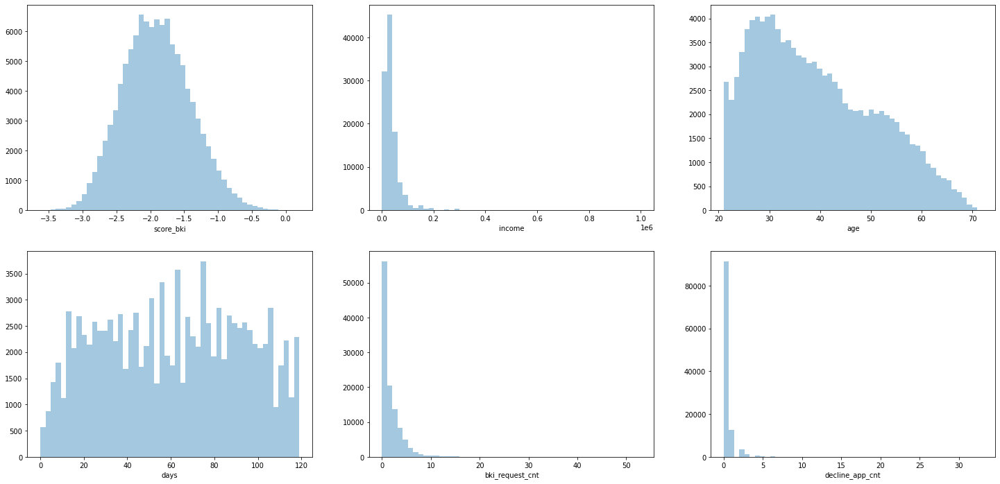

In [126]:
# посмотрим на распределение числовых признаков
fig, axes = plt.subplots(2, 3, figsize=(25, 12))
for col, i in zip(num_cols, range(6)):
    sns.distplot(data[col], kde=False, ax=axes.flat[i])


In [ ]:
Видим, что у некоторых признаков распределение смещено - попробуем логарифмировать.

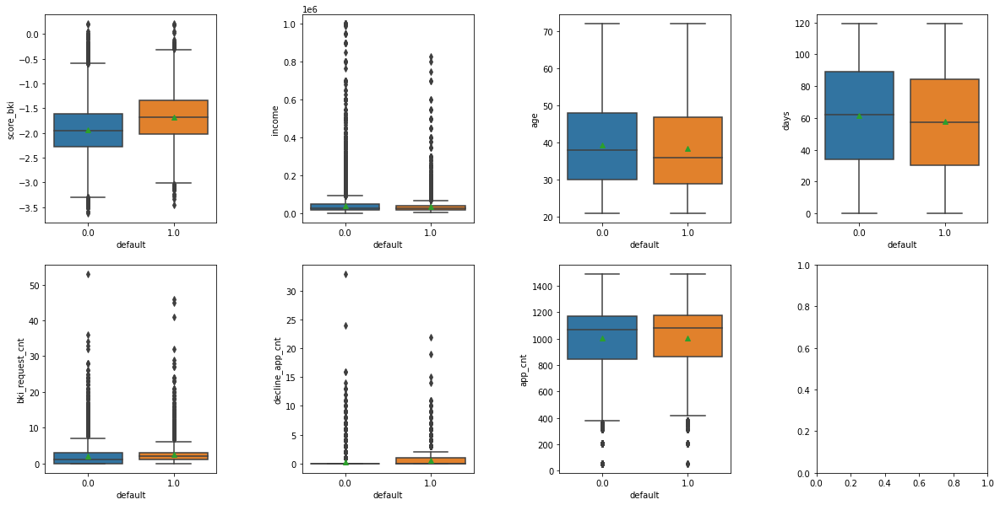

In [128]:
# построим боксплоты для числовых признаков и целевой переменной - поищем выбросы
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
for i in range(len(num_cols)):
    sns.boxplot(
        x="default",
        y=num_cols[i],
        data=data,
        orient="v",
        ax=axes[i],
        showfliers=True,
        showmeans=True,
    )


Видим, что данные распределены не равномерно - много точек, которые выходят за
макисмальное значение. Можно будет их удалить, в начале посмотрим как будет работать 
модель с ними.

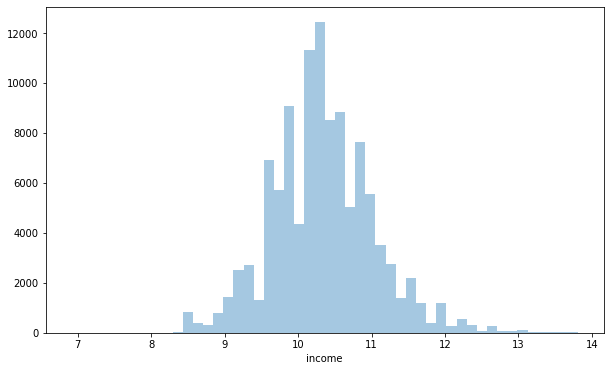

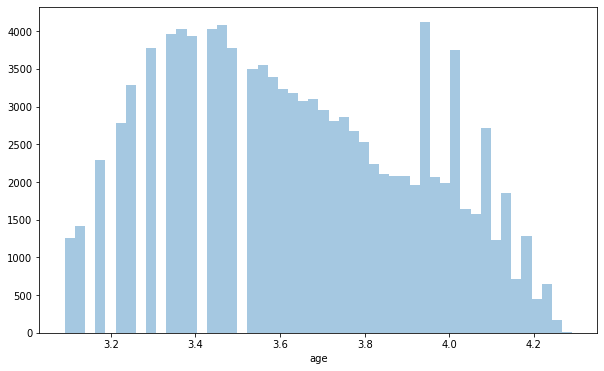

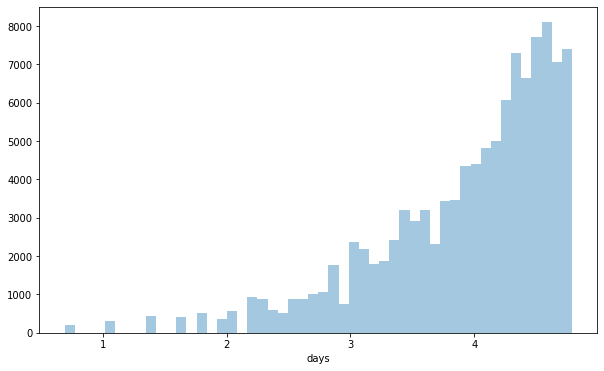

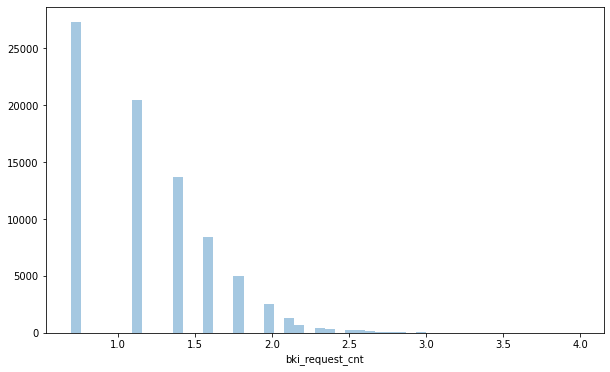

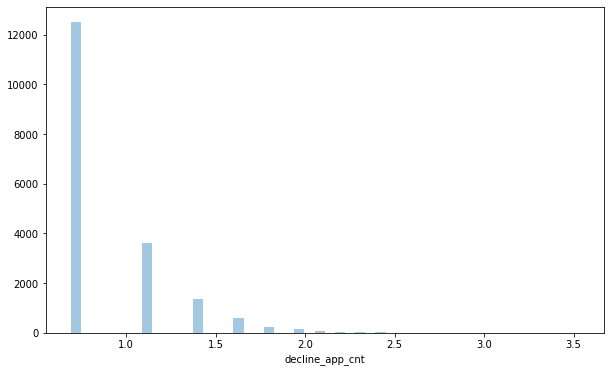

In [129]:
# логорифмируем
log_num_cols = ["income", "age", "days", "bki_request_cnt", "decline_app_cnt"]
for i in log_num_cols:
    data[i] = np.log(data[i] + 1)
    plt.figure(figsize=(10, 6))
    sns.distplot(data[i][data[i] > 0].dropna(), kde=False, rug=False)
    plt.show()


<AxesSubplot:>

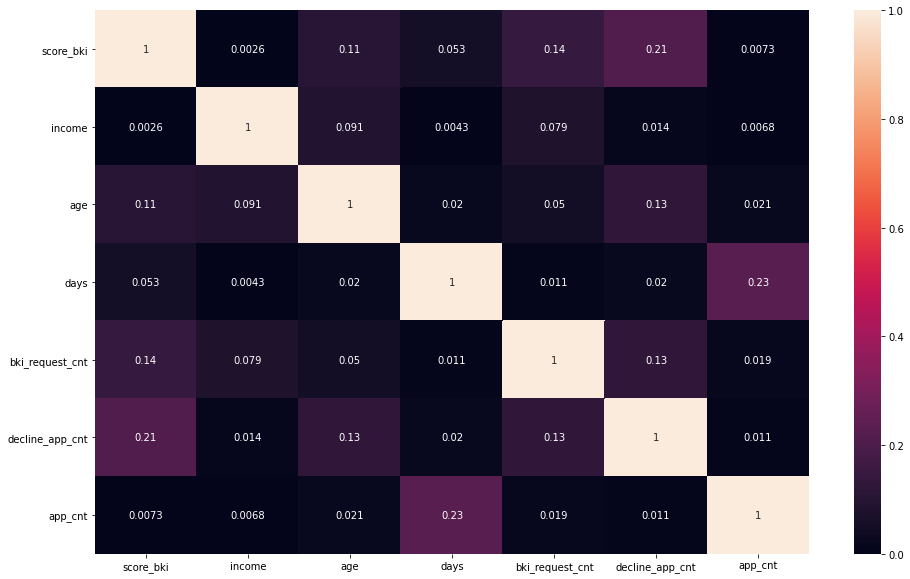

In [130]:
# посмотрим на корреляцию
plt.figure(figsize=(16, 10))
sns.heatmap(data[num_cols].corr().abs(), vmin=0, vmax=1, annot=True)


Видим высокую корреляцию между score_bki и decline_app_cnt, days.

### Преобразование бинарных и категориальных переменных

In [131]:
# Преобразуем education в целочисленный формат
label_encoder = LabelEncoder()
data["education"] = label_encoder.fit_transform(data["education"])
data.education.unique()


array([3, 1, 4, 2, 0])

In [132]:
# Закодируем region_rating
label_encoder = LabelEncoder()
data["region_rating"] = label_encoder.fit_transform(data["region_rating"])
data.region_rating.unique()


array([3, 6, 4, 2, 5, 0, 1])

In [133]:
# Преобразуем биноминальные признаки
label_encoder = LabelEncoder()
for col in bin_cols:
    data[col] = label_encoder.fit_transform(data[col])

# убедимся в преобразовании
data.head(5)


,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train,days,app_date_weekday,app_cnt
0,2014-02-01,3,1,4.143135,1,1,0.000000,0,-2.008753,0.693147,3,1,2,9.798183,4,1,0,0.0,1,3.465736,5,794
1,2014-03-12,3,0,4.094345,0,0,0.000000,0,-1.532276,1.386294,3,2,3,9.852247,4,1,0,0.0,1,4.262680,2,1110
2,2014-02-01,3,1,3.258097,1,0,1.098612,0,-1.408142,0.693147,6,1,2,10.308986,1,4,1,0.0,1,3.465736,5,794
3,2014-01-23,3,0,3.988984,0,0,0.000000,0,-2.057471,1.098612,3,2,3,9.210440,1,3,0,0.0,1,3.135494,3,1060
4,2014-04-18,1,1,3.891820,0,0,0.000000,1,-1.244723,0.693147,4,2,3,10.308986,1,4,1,0.0,1,4.682131,4,981


In [134]:
# проверим
for column in bin_cols:
    print("Уникальные значения в поле {0} : {1}".format(column, data[column].unique()))


Уникальные значения в поле sex : [1 0]
Уникальные значения в поле good_work : [0 1]
Уникальные значения в поле car : [1 0]
Уникальные значения в поле car_type : [1 0]
Уникальные значения в поле foreign_passport : [0 1]


### Значимость переменных

Значимость непрерывных переменных (на основе однофакторного дисперсионного анализа (ANOVA)) Для оценки значимости числовых переменных будем использовать функцию f_classif из библиотеки sklearn.

В качестве меры значимости мы будем использовать значение f -статистики. Чем значение статистики выше, тем меньше вероятность того, что средние значения не отличаются, и тем важнее данный признак для нашей линейной модели.

<AxesSubplot:>

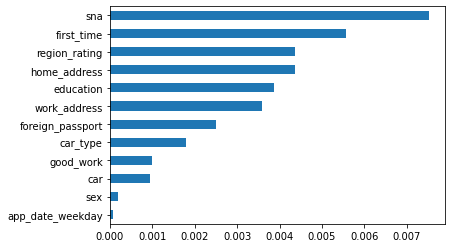

In [135]:
imp_cat = pd.Series(
    mutual_info_classif(
        data[data.Train == 1][bin_cols + cat_cols],
        data[data.Train == 1]["default"],
        discrete_features=True,
    ),
    index=bin_cols + cat_cols,
)
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind="barh")


+ cамый значимый признак - sna
+ наименее значимый признак - app_date_weekday

<AxesSubplot:>

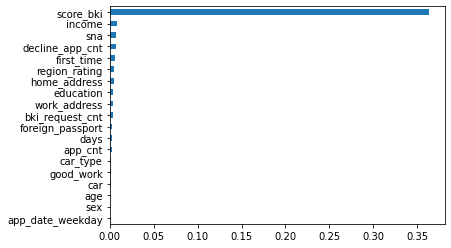

In [ ]:
# посмотрим на значимость всех признаков
imp_cat = pd.Series(
    mutual_info_classif(
        data[data.Train == 1][cat_cols + bin_cols + num_cols],
        data[data.Train == 1]["default"],
        discrete_features=True,
    ),
    index=cat_cols + bin_cols + num_cols,
)
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind="barh")


Самые значимые признаки: score_bki, income.
Наимение значимые: age и sex, app_date_weekday.

In [ ]:
import plotly.express as px

fig = px.scatter_3d(
    data[data.Train == 1], x="score_bki", y="income", z="sna", color="default"
)
fig.show()


Так как основная идея линейного классификатора заключается в том, что признаковое 
пространство может быть разделено гиперплоскостью на два полупространства, 
в каждом из которых прогнозируется одно из двух значений целевого класса. 
При таком распределении не получится найти адекватную разделяющую поверхность.
Поэтому качество предсказания логистической регрессии будет не очень высокое.

In [136]:
# закодируем категориальные признаки при помощи get_dummy
data_cat = pd.get_dummies(data.loc[:, cat_cols], columns=cat_cols)
data_cat.sample(3)


,education_0,education_1,education_2,education_3,education_4,sna_1,sna_2,sna_3,sna_4,first_time_1,first_time_2,first_time_3,first_time_4,app_date_weekday_0,app_date_weekday_1,app_date_weekday_2,app_date_weekday_3,app_date_weekday_4,app_date_weekday_5,app_date_weekday_6,work_address_1,work_address_2,work_address_3,home_address_1,home_address_2,home_address_3,region_rating_0,region_rating_1,region_rating_2,region_rating_3,region_rating_4,region_rating_5,region_rating_6
30916,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0
4243,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0
9343,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0


In [137]:
# стандартизиуем числовые признаки
data_num = pd.DataFrame(
    StandardScaler().fit_transform(data[num_cols]), columns=num_cols
)


In [138]:
# объединим все признаки в один датасет
X = pd.concat(
    [data_num, data_cat, data[bin_cols], data["Train"], data["default"]], axis=1
)
Y = data["default"].values


In [69]:
# посмотрим на получившийся датасет
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73799 entries, 0 to 73798
Data columns (total 45 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   score_bki           73799 non-null  float64
 1   income              73799 non-null  float64
 2   age                 73799 non-null  float64
 3   days                73799 non-null  float64
 4   bki_request_cnt     73799 non-null  float64
 5   decline_app_cnt     73799 non-null  float64
 6   app_cnt             73799 non-null  int64  
 7   education_0         73799 non-null  uint8  
 8   education_1         73799 non-null  uint8  
 9   education_2         73799 non-null  uint8  
 10  education_3         73799 non-null  uint8  
 11  education_4         73799 non-null  uint8  
 12  sna_1               73799 non-null  uint8  
 13  sna_2               73799 non-null  uint8  
 14  sna_3               73799 non-null  uint8  
 15  sna_4               73799 non-null  uint8  
 16  firs

In [139]:
print(cat_cols + bin_cols)


['education', 'sna', 'first_time', 'app_date_weekday', 'work_address', 'home_address', 'region_rating', 'sex', 'good_work', 'car', 'car_type', 'foreign_passport']


# Модели

### Модель 1. Наивная

In [78]:
# разделим и подготовим данные
X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()


In [72]:
# проверим
print(X.shape, X_train.shape, X_test.shape)


(73799, 45) (59039, 45) (14760, 45)


In [73]:
# обучим модель
model = LogisticRegression(max_iter=2000, random_state=RANDOM_SEED)
model.fit(X_train, y_train)


LogisticRegression(max_iter=2000, random_state=42)

In [74]:
mi_logreg = ModelInspect(model, X_test, y_test)


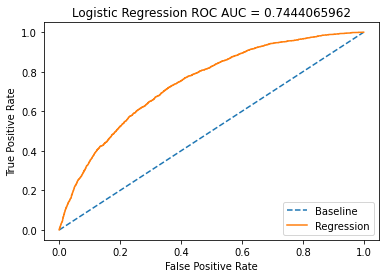

In [75]:
mi_logreg.roc_curve_plot()


Получилась достаточно высокий результат для метрики ROC AUC. Чем она ближе к верхнему 
левому углу, тем лучше.

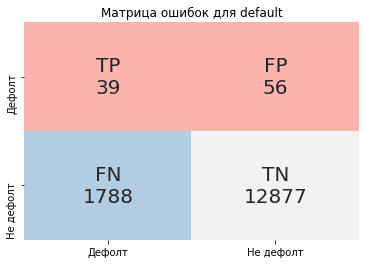

In [76]:
mi_logreg.confusion_matrix_plot()


На матрице ошибок по главной диагонали 12912 клиентов, при этом ложноотрицательных
1788 (предсказали, что отдадут кредит, а они не отдали), ложноположительных (предсказали,
что не отдадут кредит, а они отдали) - 60

In [77]:
mi_logreg.get_metrics()


accuracy     0.875068
logloss      4.315010
precision    0.410526
recall       0.021346
F1           0.040583
ROC_AUC      0.744407
dtype: float64

ROC_AUC и accuracy (доля объектов, которые алгоритм отнес к верному классу.)
достаточно высокие, но F1 - низкий, что говорит о том, что модель
совершает ошибку второго рода - слишком много клиентов оказывается в ложноотрицательных.

### Общая функция для подготовки данных

Изначально стандартизацию числовых признаков делала внутри функции. Затем вынесла
после деления датасета - ROC-AUC стал выше на 0.02, 
в матрице ошибок увеличилось количество на главное диагонали - на два клиента. Также 
это сделано с целью избежать утечки данных.

In [140]:
# попробуем переместить scaler для устранения даталиков


warnings.simplefilter("ignore")

# собираем функцию для подготовки данных
def prepare_data_for_ml():
    data_directory = "/work/skillfactory_rds/sf_module_4/data_kaggle/"
    train = pd.read_csv(data_directory + "train.csv")
    test = pd.read_csv(data_directory + "test.csv")

    # для корректной обработки признаков объединяем трейн и тест в один датасет
    train["Train"] = 1  # помечаем где у нас трейн
    test["Train"] = 0  # помечаем где у нас тест

    # объединяем
    data = train.append(test, sort=False).reset_index(drop=True)

    # заменяем пропуски в education
    mode = data.education.mode()[0]
    data["education"].fillna(mode, inplace=True)
    data.education.unique()

    # обработка поля app_date
    data["app_date"] = pd.to_datetime(data.app_date, format="%d%b%Y")
    start = data.app_date.min()
    end = data.app_date.max()
    # Вводим новый признак - номер дня с 1 января 2014 года
    data["days"] = (data.app_date - start).dt.days.astype("int")
    # Месяц подачи заявки
    data["app_date_month"] = data.app_date.dt.month
    # День недели, в который была подана заявка
    data["app_date_weekday"] = data.app_date.dt.weekday

    # еще один признак: количество заявок в данном дне
    dates = data.app_date.value_counts()
    data["app_cnt"] = data.app_date.apply(lambda x: dates[x])

    # Удалим из датасета признаки с высокой корреляцией или без дополнительной инф
    data.drop(["app_date_month", "client_id"], axis=1, inplace=True)

    # числовые признаки
    num_cols = [
        "score_bki",
        "income",
        "age",
        "days",
        "bki_request_cnt",
        "decline_app_cnt",
        "app_cnt",
    ]

    # бинарные признаки
    bin_cols = ["sex", "good_work", "car", "car_type", "foreign_passport"]

    # категориальные признаки
    cat_cols = [
        "education",
        "sna",
        "first_time",
        "app_date_weekday",
        "work_address",
        "home_address",
        "region_rating",
    ]

    # логорифмируем
    log_num_cols = ["income", "age", "days", "bki_request_cnt", "decline_app_cnt"]

    for i in log_num_cols:
        data[i] = np.log(data[i] + 1)

    # Преобразуем в целочисленный формат
    label_encoder = LabelEncoder()
    data["education"] = label_encoder.fit_transform(data["education"])
    data["region_rating"] = label_encoder.fit_transform(data["region_rating"])

    for col in bin_cols:
        data[col] = label_encoder.fit_transform(data[col])

    # закодируем категориальные признаки при помощи get_dummy
    data_cat = pd.get_dummies(data.loc[:, cat_cols], columns=cat_cols)

    # стандартизиуем числовые признаки
    # data_num = pd.DataFrame(StandardScaler().fit_transform(data[num_cols]), columns = num_cols)

    # объединим все признаки в один датасет
    X = pd.concat(
        [data[num_cols], data_cat, data[bin_cols], data["Train"], data["default"]],
        axis=1,
    )
    Y = data["default"].values

    # разделим данные на тренировочные и тестовые
    train_data = X.query("Train == 1").drop(["Train"], axis=1)
    test_data = X.query("Train == 0").drop(["Train"], axis=1)

    # целевая переменная
    y = train_data.default.values
    X = train_data.drop(["default"], axis=1)

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=RANDOM_SEED
    )
    # разделим выборку не тестовую или обучающую
    return X_train, X_test, y_train, y_test, X, y, test_data


def draw_ml_results(model, X_test, y_test):
    mi_logreg_penalty = ModelInspect(model, X_test, y_test)
    mi_logreg_penalty.roc_curve_plot()
    mi_logreg_penalty.confusion_matrix_plot()
    metrics = mi_logreg_penalty.get_metrics()
    print(metrics)


def gen_submission_csv(test_data, model, filename="sample_submission"):
    main_test = pd.read_csv(data_directory + "test.csv")
    X_test = test_data.drop(["default"], axis=1)
    y_pred_prob = model.predict_proba(X_test)[:, 1]

    submit = pd.DataFrame(main_test.client_id)
    submit["default"] = y_pred_prob
    submit.to_csv(f"{filename}.csv", index=False)


### Модель 2. Тестирую MinMaxScaler

In [38]:
# нормализуем выборку с помощью MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()

# определим scaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# обучим модель
model = LogisticRegression(
    max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(X_train, y_train)


In [40]:
# подготовка для сабмишона
*_, X, y, test_data = prepare_data_for_ml()
model = LogisticRegression(
    max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(X, y)


LogisticRegression(max_iter=2000, penalty='l1', random_state=42,
                   solver='liblinear')

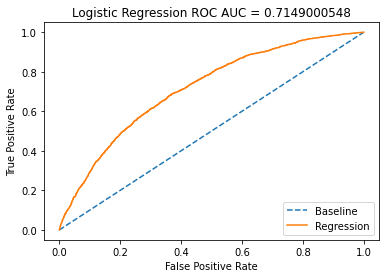

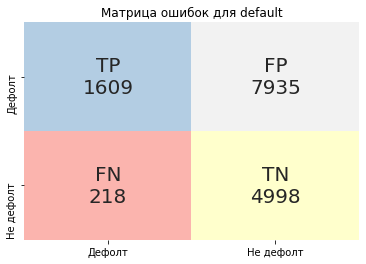

accuracy      0.447629
logloss      19.078658
precision     0.168588
recall        0.880679
F1            0.283001
ROC_AUC       0.714900
dtype: float64


In [41]:
draw_ml_results(model, X_test, y_test)


### Модель 3. Добавляем регуляризацию

Попробуем добавить регуляризацию, solver - saga и liblinear, дали одинаковый результат.
Оставляю liblinear, как наиболее подходящий для небольших датасетов.

In [80]:
X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()

# обучим модель
model = LogisticRegression(
    max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(X_train, y_train)


LogisticRegression(max_iter=2000, penalty='l1', random_state=42,
                   solver='liblinear')

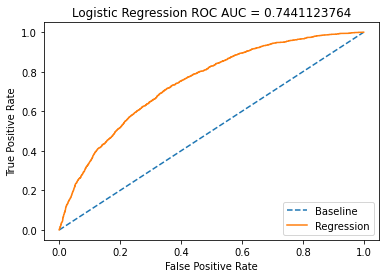

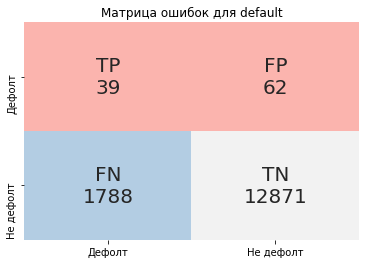

accuracy     0.874661
logloss      4.329051
precision    0.386139
recall       0.021346
F1           0.040456
ROC_AUC      0.744112
dtype: float64


In [81]:
draw_ml_results(model, X_test, y_test)


В результате применения регуляризации l1, получили увеличение метрики F1 (0.040477 против
0.038462). 
Попробуем еще применить параметр для балансировки класса.

### Модель 4. Добавляем параметр для балансировки класса

In [82]:
# обучим модель c penalty="l1" и class_weight='balanced'
X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()

model = LogisticRegression(
    class_weight="balanced",
    max_iter=2000,
    penalty="l1",
    random_state=RANDOM_SEED,
    solver="liblinear",
)
model.fit(X_train, y_train)


LogisticRegression(class_weight='balanced', max_iter=2000, penalty='l1',
                   random_state=42, solver='liblinear')

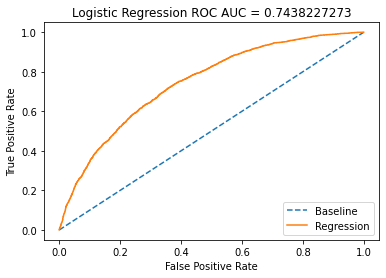

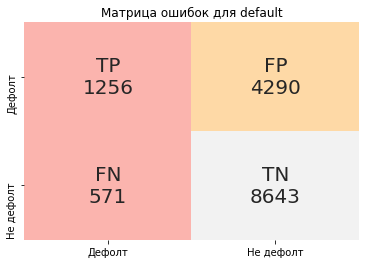

accuracy      0.670664
logloss      11.375096
precision     0.226470
recall        0.687466
F1            0.340703
ROC_AUC       0.743823
dtype: float64


In [83]:
draw_ml_results(model, X_test, y_test)


Пробовала обучить модель c penalty="l2" и class_weight='balanced', но показатели
ухудшились.

### Модель 5. GridSearchCV

Попробуем подобрать параметры с помощью GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV

X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()

model = LogisticRegression(random_state=RANDOM_SEED)
param_grid = [
    {
        "penalty": ["l1"],
        "solver": ["liblinear", "lbfgs"],
        "class_weight": ["none", "balanced"],
        "multi_class": ["auto", "ovr"],
    },
    {
        "penalty": ["l2"],
        "solver": ["newton-cg", "lbfgs", "liblinear", "sag", "saga"],
        "class_weight": ["none", "balanced"],
        "multi_class": ["auto", "ovr"],
    },
    {
        "penalty": ["none"],
        "solver": ["newton-cg", "lbfgs", "sag", "saga"],
        "class_weight": ["none", "balanced"],
        "multi_class": ["auto", "ovr"],
    },
]
gridsearch = GridSearchCV(model, param_grid, scoring="f1", n_jobs=-1)
gridsearch.fit(X_train, y_train)
model_bestparams = gridsearch.best_estimator_
## печатаем параметры
best_parameters = model.get_params()


KeyboardInterrupt: 

In [ ]:
# результат на сабе 0.73532, ниже 2 модели
gen_submission_csv(test_data, model_bestparams, "sub_GSV")


In [ ]:
print(best_parameters)


{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


In [ ]:
draw_ml_results(model_bestparams, X_test, y_test)


NameError: name 'model_bestparams' is not defined

### Модель 6. k-fold cross-validation

In [85]:
# проверим результат с k-fold cross-validation

# заагрузим датасет
*_, X, y, test_data = prepare_data_for_ml()
# определим pipeline
steps = list()
steps.append(("scaler", MinMaxScaler()))
steps.append(("model", LogisticRegression()))
pipeline = Pipeline(steps=steps)
# определим метод оценки
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=RANDOM_SEED)
# evaluate the model using cross-validation
# scores = cross_val_score(pipeline, X, y, cv=cv, n_jobs=-1)
# # report performance
# print(scores)

scores = cross_val_score(pipeline, X, y, scoring="f1_micro", cv=cv, n_jobs=-1)
score = mean(scores)
print("F1 Score: %.3f" % score)


F1 Score: 0.872


In [90]:
# результат на сабе равен результату 2 модели
gen_submission_csv(test_data, model,'sub_2')

### Модель 7. Дерево решений для несбалансированной выборки

In [89]:
# проверим как работает дерево решений для несбалансированной выборки
*_, X, y, _ = prepare_data_for_ml()
# определеим pipeline
steps = [("under", RandomUnderSampler()), ("model", DecisionTreeClassifier())]
pipeline = Pipeline(steps=steps)
# загрузим pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(pipeline, X, y, scoring="f1_micro", cv=cv, n_jobs=-1)
score = mean(scores)
print("F1 Score: %.3f" % score)


F1 Score: 0.577


Когда начала изучать про несбалансированность выборок, то застряла на моменте метрики - какую выбрать f1_micro или f1_macro. От этого не могла понять насколько лучше или хуже получается результат, по сравнению с другими моделями - записала для дальнейшего разбора. Результат на сабмишоне оказался хуже, чем у CatBoost.

### Модель 8. Библиотека feature_engine

Попробую применить библиотеку feature_engine для обработки переменных и сравнить
результат.

In [95]:
# готовим данные
X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()


In [96]:
# собираем в Pipeline
value_pipe = pipe(
    [
        # создаем новые признаки на основе математических комбинаций
        (
            "math_combinator_mean",
            MathematicalCombination(
                variables_to_combine=["age", "income"],
                math_operations=["mean"],
                new_variables_names=["avg_age_income"],
            ),
        ),
        (
            "math_combinator_sum",
            MathematicalCombination(
                variables_to_combine=["car", "car_type"],
                math_operations=["sum"],
                new_variables_names=["total_car_type"],
            ),
        ),
        # применяем скейлер
        ("scaler", StandardScaler()),
        # логистическая регрессия
        ("LogisticRegression", LogisticRegression()),
    ]
)


In [97]:
# применяем
value_pipe.fit(X_train, y_train)


Pipeline(steps=[('math_combinator_mean',
                 MathematicalCombination(math_operations=['mean'],
                                         new_variables_names=['avg_age_income'],
                                         variables_to_combine=['age',
                                                               'income'])),
                ('math_combinator_sum',
                 MathematicalCombination(math_operations=['sum'],
                                         new_variables_names=['total_car_type'],
                                         variables_to_combine=['car',
                                                               'car_type'])),
                ('scaler', StandardScaler()),
                ('LogisticRegression', LogisticRegression())])

In [98]:
# совершаем предсказание
pred_train = value_pipe.predict(X_train)
pred_test = value_pipe.predict(X_test)


In [36]:
# сравниваем результат для тестовой и обучающей выборки
print(
    "Logistic Regression Model train accuracy score: {}".format(
        accuracy_score(y_train, pred_train)
    )
)
print()
print(
    "Logistic Regression Model test accuracy score: {}".format(
        accuracy_score(y_test, pred_test)
    )
)


Logistic Regression Model train accuracy score: 0.8720337404088823

Logistic Regression Model test accuracy score: 0.8746612466124661


In [99]:
# f1 score ниже, чем у большинства моделей, новые признаки не улучшили результат
# вернуться, когда будут идеи для новых признаков на основе математических операций
print(
    "Logistic Regression Model train f1 score: {}".format(f1_score(y_train, pred_train))
)
print()
print("Logistic Regression Model test f1 score: {}".format(f1_score(y_test, pred_test)))


Logistic Regression Model train f1 score: 0.05645060571999501

Logistic Regression Model test f1 score: 0.03946002076843198


### Модель 9. CatBoost

In [42]:
X_train, X_test, y_train, y_test, X, y, *_ = prepare_data_for_ml()


In [43]:
categorical_features_indices = np.where(X.dtypes != np.float)[0]


In [50]:
# определяем модель
model = CatBoostClassifier(
    custom_loss=["Accuracy"], random_seed=42, logging_level="Silent"
)


In [51]:
# обучаем
model.fit(
    X_train,
    y_train,
    cat_features=categorical_features_indices,
    eval_set=(X_test, y_test),
    # logging_level='Verbose',
    plot=True,
)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Лучший результат на тетсовой выборке равен 0.3318688639 и был получен на 199 итерации

In [52]:
# добавляем кросс валидацию
cv_params = model.get_params()
cv_params.update({"loss_function": "Logloss"})
cv_data = cv(
    Pool(X, y, cat_features=categorical_features_indices), cv_params, plot=True
)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [53]:
# считаем метрики
print(
    "Best validation accuracy score: {:.2f}±{:.2f} on step {}".format(
        np.max(cv_data["test-Accuracy-mean"]),
        cv_data["test-Accuracy-std"][np.argmax(cv_data["test-Accuracy-mean"])],
        np.argmax(cv_data["test-Accuracy-mean"]),
    )
)


Best validation accuracy score: 0.87±0.00 on step 320


In [54]:
print(
    "Precise validation accuracy score: {}".format(
        np.max(cv_data["test-Accuracy-mean"])
    )
)


Precise validation accuracy score: 0.8732367676170765


In [62]:
# предсказание 
predictions = model.predict(X_test)
predictions_probs = model.predict_proba(X_test)

print(predictions[:10])
print(predictions_probs[:10])


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[[0.96679739 0.03320261]
 [0.70900139 0.29099861]
 [0.92661675 0.07338325]
 [0.9266117  0.0733883 ]
 [0.98205463 0.01794537]
 [0.84718785 0.15281215]
 [0.69577466 0.30422534]
 [0.94989632 0.05010368]
 [0.98084059 0.01915941]
 [0.9801617  0.0198383 ]]


Пробую улучшить результат 

In [ ]:
model_without_seed = CatBoostClassifier(iterations=10, logging_level="Silent")
model_without_seed.fit(X, y, cat_features=categorical_features_indices)

print("Random seed assigned for this model: {}".format(model_without_seed.random_seed_))


Random seed assigned for this model: 0


In [ ]:
params = {
    "iterations": 500,
    "learning_rate": 0.1,
    "eval_metric": "Accuracy",
    "random_seed": 42,
    "logging_level": "Silent",
    "use_best_model": False,
}
train_pool = Pool(X_train, y_train, cat_features=categorical_features_indices)
validate_pool = Pool(X_test, y_test, cat_features=categorical_features_indices)


In [ ]:
model = CatBoostClassifier(**params)
model.fit(train_pool, eval_set=validate_pool)

best_model_params = params.copy()
best_model_params.update({"use_best_model": True})
best_model = CatBoostClassifier(**best_model_params)
best_model.fit(train_pool, eval_set=validate_pool)

print(
    "Simple model validation accuracy: {:.4}".format(
        accuracy_score(y_test, model.predict(X_test))
    )
)
print("")

print(
    "Best model validation accuracy: {:.4}".format(
        accuracy_score(y_test, best_model.predict(X_test))
    )
)


Simple model validation accuracy: 0.8743

Best model validation accuracy: 0.8764


In [ ]:
# ранняя остановка
%time
model = CatBoostClassifier(**params)
model.fit(train_pool, eval_set=validate_pool)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.63 µs


In [ ]:
# проверили, результат за счет ранней остановки
%time
earlystop_params = params.copy()
earlystop_params.update({
    'od_type': 'Iter',
    'od_wait': 40
})
earlystop_model = CatBoostClassifier(**earlystop_params)
earlystop_model.fit(train_pool, eval_set=validate_pool);

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 8.34 µs


In [ ]:
# печатаем метрики
print("Simple model tree count: {}".format(model.tree_count_))
print(
    "Simple model validation accuracy: {:.4}".format(
        accuracy_score(y_test, model.predict(X_test))
    )
)
print("")

print("Early-stopped model tree count: {}".format(earlystop_model.tree_count_))
print(
    "Early-stopped model validation accuracy: {:.4}".format(
        accuracy_score(y_test, earlystop_model.predict(X_test))
    )
)


Simple model tree count: 500
Simple model validation accuracy: 0.8743

Early-stopped model tree count: 84
Early-stopped model validation accuracy: 0.8759


In [ ]:
# применяем baseline
current_params = params.copy()
current_params.update({"iterations": 10})
model = CatBoostClassifier(**current_params).fit(
    X_train, y_train, categorical_features_indices
)
# только для prediction_type='RawFormulaVal'
baseline = model.predict(X_train, prediction_type="RawFormulaVal")
# Fit new model
model.fit(X_train, y_train, categorical_features_indices, baseline=baseline)


In [ ]:
# делаем снапшот для того, чтобы можно было вернуться к промежуточным стадиям обучения
params_with_snapshot = params.copy()
params_with_snapshot.update(
    {"iterations": 5, "learning_rate": 0.5, "logging_level": "Verbose"}
)
model = CatBoostClassifier(**params_with_snapshot).fit(
    train_pool, eval_set=validate_pool, save_snapshot=True
)
params_with_snapshot.update(
    {
        "iterations": 10,
        "learning_rate": 0.1,
    }
)
model = CatBoostClassifier(**params_with_snapshot).fit(
    train_pool, eval_set=validate_pool, save_snapshot=True
)


0:	learn: 0.8722031	test: 0.8762195	best: 0.8762195 (0)	total: 59.3ms	remaining: 237ms
1:	learn: 0.8722031	test: 0.8762195	best: 0.8762195 (0)	total: 102ms	remaining: 153ms
2:	learn: 0.8722539	test: 0.8762195	best: 0.8762195 (0)	total: 167ms	remaining: 111ms
3:	learn: 0.8723386	test: 0.8760163	best: 0.8762195 (0)	total: 210ms	remaining: 52.4ms
4:	learn: 0.8725588	test: 0.8758130	best: 0.8762195 (0)	total: 287ms	remaining: 0us

bestTest = 0.8762195122
bestIteration = 0

5:	learn: 0.8725758	test: 0.8756775	best: 0.8762195 (0)	total: 347ms	remaining: 240ms
6:	learn: 0.8724911	test: 0.8757453	best: 0.8762195 (0)	total: 410ms	remaining: 184ms
7:	learn: 0.8725419	test: 0.8757453	best: 0.8762195 (0)	total: 497ms	remaining: 140ms
8:	learn: 0.8725927	test: 0.8758130	best: 0.8762195 (0)	total: 545ms	remaining: 64.4ms
9:	learn: 0.8725927	test: 0.8759485	best: 0.8762195 (0)	total: 612ms	remaining: 0us

bestTest = 0.8762195122
bestIteration = 0



In [ ]:
# создаем собственный класс для расчета logloss
class LoglossObjective(object):
    def calc_ders_range(self, approxes, targets, weights):
        # approxes, targets, weights are indexed containers of floats
        # (containers which have only __len__ and __getitem__ defined).
        # weights parameter can be None.
        #
        # To understand what these parameters mean, assume that there is
        # a subset of your dataset that is currently being processed.
        # approxes contains current predictions for this subset,
        # targets contains target values you provided with the dataset.
        #
        # This function should return a list of pairs (der1, der2), where
        # der1 is the first derivative of the loss function with respect
        # to the predicted value, and der2 is the second derivative.
        #
        # In our case, logloss is defined by the following formula:
        # target * log(sigmoid(approx)) + (1 - target) * (1 - sigmoid(approx))
        # where sigmoid(x) = 1 / (1 + e^(-x)).

        assert len(approxes) == len(targets)
        if weights is not None:
            assert len(weights) == len(approxes)

        result = []
        for index in range(len(targets)):
            e = np.exp(approxes[index])
            p = e / (1 + e)
            der1 = (1 - p) if targets[index] > 0.0 else -p
            der2 = -p * (1 - p)

            if weights is not None:
                der1 *= weights[index]
                der2 *= weights[index]

            result.append((der1, der2))
        return result


In [ ]:
model = CatBoostClassifier(
    iterations=10,
    random_seed=42,
    loss_function=LoglossObjective(),
    eval_metric="Logloss",
)
model.fit(train_pool)
# только prediction_type='RawFormulaVal' разрешен с `loss_function`
preds_raw = model.predict(X_test, prediction_type="RawFormulaVal")


0:	learn: 0.6764586	total: 1.15s	remaining: 10.3s
1:	learn: 0.6605788	total: 2.37s	remaining: 9.48s
2:	learn: 0.6457190	total: 3.51s	remaining: 8.2s
3:	learn: 0.6317693	total: 4.68s	remaining: 7.02s
4:	learn: 0.6183793	total: 5.88s	remaining: 5.88s
5:	learn: 0.6061113	total: 7s	remaining: 4.67s
6:	learn: 0.5941854	total: 8.25s	remaining: 3.53s
7:	learn: 0.5829770	total: 9.37s	remaining: 2.34s
8:	learn: 0.5721669	total: 10.5s	remaining: 1.17s
9:	learn: 0.5621866	total: 11.6s	remaining: 0us


In [ ]:
class LoglossMetric(object):
    def get_final_error(self, error, weight):
        return error / (weight + 1e-38)

    def is_max_optimal(self):
        return False

    def evaluate(self, approxes, target, weight):
        # approxes is a list of indexed containers
        # (containers with only __len__ and __getitem__ defined),
        # one container per approx dimension.
        # Each container contains floats.
        # weight is a one dimensional indexed container.
        # target is float.

        # weight parameter can be None.
        # Returns pair (error, weights sum)

        assert len(approxes) == 1
        assert len(target) == len(approxes[0])

        approx = approxes[0]

        error_sum = 0.0
        weight_sum = 0.0

        for i in range(len(approx)):
            w = 1.0 if weight is None else weight[i]
            weight_sum += w
            error_sum += -w * (target[i] * approx[i] - np.log(1 + np.exp(approx[i])))

        return error_sum, weight_sum


In [ ]:
model = CatBoostClassifier(
    iterations=10, random_seed=42, loss_function="Logloss", eval_metric=LoglossMetric()
)
# обучаем модель
model.fit(train_pool)
# только prediction_type='RawFormulaVal' разрешен с `loss_function`
preds_raw = model.predict(X_test, prediction_type="RawFormulaVal")


Learning rate set to 0.5
0:	learn: 0.4313022	total: 425ms	remaining: 3.82s
1:	learn: 0.3748290	total: 872ms	remaining: 3.49s
2:	learn: 0.3551182	total: 1.28s	remaining: 2.98s
3:	learn: 0.3487143	total: 1.64s	remaining: 2.46s
4:	learn: 0.3459837	total: 2.05s	remaining: 2.05s
5:	learn: 0.3427224	total: 2.43s	remaining: 1.62s
6:	learn: 0.3415962	total: 2.81s	remaining: 1.21s
7:	learn: 0.3405438	total: 3.19s	remaining: 797ms
8:	learn: 0.3399487	total: 3.59s	remaining: 399ms
9:	learn: 0.3391067	total: 3.98s	remaining: 0us


In [ ]:
# staged predict
model = CatBoostClassifier(iterations=10, random_seed=42, logging_level="Silent").fit(
    train_pool
)
ntree_start, ntree_end, eval_period = 3, 9, 2
predictions_iterator = model.staged_predict(
    validate_pool, "Probability", ntree_start, ntree_end, eval_period
)
for preds, tree_count in zip(
    predictions_iterator, range(ntree_start, ntree_end, eval_period)
):
    print(
        "First class probabilities using the first {} trees: {}".format(
            tree_count, preds[:5, 1]
        )
    )


First class probabilities using the first 3 trees: [0.54273425 0.47017885 0.44494243 0.53000975 0.57220267]
First class probabilities using the first 5 trees: [0.50421704 0.44710134 0.40286018 0.49690937 0.59372724]
First class probabilities using the first 7 trees: [0.53403805 0.44255296 0.37784244 0.50236304 0.61824609]


In [ ]:
# определим самые важные признаки
model = CatBoostClassifier(iterations=50, random_seed=42, logging_level="Silent").fit(
    train_pool
)
feature_importances = model.get_feature_importance(train_pool)
feature_names = X_train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    print("{}: {}".format(name, score))


score_bki: 20.82574941076282
days: 7.068014378004562
age: 6.066034530261166
bki_request_cnt: 6.044268690276869
region_rating_6: 5.970209034330788
decline_app_cnt: 5.278828965789472
income: 5.242563691948535
home_address_2: 4.656617804339922
work_address_3: 3.134294385744278
education_1: 3.129750849317246
sna_1: 2.9959356516212545
sex: 2.2642597260849713
good_work: 2.1003130876013674
first_time_1: 2.094274844019578
region_rating_2: 1.951330659669135
sna_4: 1.6625494513898096
region_rating_3: 1.519537857714961
region_rating_5: 1.4103024720929394
first_time_2: 1.3709067842007974
foreign_passport: 1.156483843955967
work_address_1: 1.154376656211359
app_date_weekday_4: 1.0126512221866655
education_3: 0.9720269995610131
app_date_weekday_2: 0.9406268508645466
education_2: 0.9300330204216618
car_type: 0.9008842680457652
education_4: 0.7659915193915535
app_date_weekday_0: 0.7395003384070714
car: 0.6219623810713449
sna_3: 0.6069863464699224
work_address_2: 0.5627252180939073
sna_2: 0.54918850702

Самые важные признаки - score_bki, days, age,bki_request_cnt

In [ ]:
model = CatBoostClassifier(iterations=50, random_seed=42, logging_level="Silent").fit(
    train_pool
)
eval_metrics = model.eval_metrics(validate_pool, ["AUC"], plot=True)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [ ]:
print(eval_metrics["AUC"][:6])


[0.6291810417303343, 0.6873947329318113, 0.7260284796499292, 0.7318759294618964, 0.7339536030734968, 0.7386354734397832]


In [ ]:
# сравнение двух моделей
model1 = CatBoostClassifier(
    iterations=10, depth=1, train_dir="model_depth_1/", logging_level="Silent"
)
model1.fit(train_pool, eval_set=validate_pool)
model2 = CatBoostClassifier(
    iterations=10, depth=5, train_dir="model_depth_5/", logging_level="Silent"
)
model2.fit(train_pool, eval_set=validate_pool)


In [ ]:
from catboost import MetricVisualizer

widget = MetricVisualizer(["model_depth_1", "model_depth_5"])
widget.start()


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [ ]:
model = CatBoostClassifier(iterations=10, random_seed=42, logging_level="Silent").fit(
    train_pool
)
model.save_model("catboost_model.dump")
model = CatBoostClassifier()
model.load_model("catboost_model.dump")


In [ ]:
import hyperopt


def hyperopt_objective(params):
    model = CatBoostClassifier(
        l2_leaf_reg=int(params["l2_leaf_reg"]),
        learning_rate=params["learning_rate"],
        iterations=500,
        eval_metric="Accuracy",
        random_seed=42,
        verbose=False,
        loss_function="Logloss",
    )

    cv_data = cv(
        Pool(X, y, cat_features=categorical_features_indices), model.get_params()
    )
    best_accuracy = np.max(cv_data["test-Accuracy-mean"])

    return 1 - best_accuracy  # as hyperopt minimises


In [ ]:
from numpy.random import RandomState

params_space = {
    "l2_leaf_reg": hyperopt.hp.qloguniform("l2_leaf_reg", 0, 2, 1),
    "learning_rate": hyperopt.hp.uniform("learning_rate", 1e-3, 5e-1),
}

trials = hyperopt.Trials()

best = hyperopt.fmin(
    hyperopt_objective,
    space=params_space,
    algo=hyperopt.tpe.suggest,
    max_evals=50,
    trials=trials,
    rstate=RandomState(123),
)

print(best)


  6%|▌         | 3/50 [06:19<1:38:49, 126.16s/trial, best loss: 0.12685808663647846]

 98%|█████████▊| 49/50 [1:41:56<02:06, 126.15s/trial, best loss: 0.1266819343241199]

100%|██████████| 50/50 [1:44:01<00:00, 124.84s/trial, best loss: 0.1266819343241199]
{'l2_leaf_reg': 3.0, 'learning_rate': 0.207450514142231}


In [64]:
print('Precise validation accuracy score: {}'.format(np.max(cv_data['test-Accuracy-mean'])))


Precise validation accuracy score: 0.8732367676170765


In [65]:
model.fit(X, y, cat_features=categorical_features_indices)


После всех улучшений accuracy score: 0.8732367676170765 остался таким же. Загрузила этот вариант на кагл.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=1f8a4f81-220a-441c-aaed-8cf3b2c42f5b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>